# ML Labs - Nazar Ponochevnyi FI-92

## Install libraries

In [1]:
!pip3 install autogluon

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 103 kB 7.8 MB/s 
     |████████████████████████████████| 226 kB 15.9 MB/s 
     |████████████████████████████████| 286 kB 63.5 MB/s 
     |████████████████████████████████| 59 kB 7.7 MB/s 
     |████████████████████████████████| 62 kB 739 kB/s 
     |████████████████████████████████| 49 kB 5.5 MB/s 
     |████████████████████████████████| 289 kB 62.9 MB/s 
     |████████████████████████████████| 1.0 MB 49.4 MB/s 
     |████████████████████████████████| 802 kB 71.8 MB/s 
     |████████████████████████████████| 132 kB 74.6 MB/s 
     |████████████████████████████████| 41 kB 414 kB/s 
     |████████████████████████████████| 60.2 MB 1.2 MB/s 
     |████████████████████████████████| 1.6 MB 60.6 MB/s 
     |████████████████████████████████| 280 kB 58.7 MB/s 
     |████████████████████████████████| 148 kB 56.8 MB/s 
     |████████████████████████████████| 

## Load dataset

In [2]:
# download https://www.kaggle.com/datasets/zaheenhamidani/ultimate-spotify-tracks-db

In [3]:
import os
import pandas as pd

In [4]:
# open the dataset
base_folder = "./"
spotify_db_filename = "SpotifyFeatures.csv"
spotify_db_path = os.path.join(base_folder, spotify_db_filename)

data = pd.read_csv(spotify_db_path)
data.head()

,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
0,Movie,Henri Salvador,C'est beau de faire un Show,0BRjO6ga9RKCKjfDqeFgWV,0,0.611,0.389,99373,0.910,0.000,C#,0.3460,-1.828,Major,0.0525,166.969,4/4,0.814
1,Movie,Martin & les fées,Perdu d'avance (par Gad Elmaleh),0BjC1NfoEOOusryehmNudP,1,0.246,0.590,137373,0.737,0.000,F#,0.1510,-5.559,Minor,0.0868,174.003,4/4,0.816
2,Movie,Joseph Williams,Don't Let Me Be Lonely Tonight,0CoSDzoNIKCRs124s9uTVy,3,0.952,0.663,170267,0.131,0.000,C,0.1030,-13.879,Minor,0.0362,99.488,5/4,0.368
3,Movie,Henri Salvador,Dis-moi Monsieur Gordon Cooper,0Gc6TVm52BwZD07Ki6tIvf,0,0.703,0.240,152427,0.326,0.000,C#,0.0985,-12.178,Major,0.0395,171.758,4/4,0.227
4,Movie,Fabien Nataf,Ouverture,0IuslXpMROHdEPvSl1fTQK,4,0.950,0.331,82625,0.225,0.123,F,0.2020,-21.150,Major,0.0456,140.576,4/4,0.390


In [5]:
# check basic info
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 232725 entries, 0 to 232724
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   genre             232725 non-null  object 
 1   artist_name       232725 non-null  object 
 2   track_name        232725 non-null  object 
 3   track_id          232725 non-null  object 
 4   popularity        232725 non-null  int64  
 5   acousticness      232725 non-null  float64
 6   danceability      232725 non-null  float64
 7   duration_ms       232725 non-null  int64  
 8   energy            232725 non-null  float64
 9   instrumentalness  232725 non-null  float64
 10  key               232725 non-null  object 
 11  liveness          232725 non-null  float64
 12  loudness          232725 non-null  float64
 13  mode              232725 non-null  object 
 14  speechiness       232725 non-null  float64
 15  tempo             232725 non-null  float64
 16  time_signature    23

## Drop dublicates and unused cols

In [6]:
# some music has several genres, so we will drop dublicates to leave only one genre per track
data = data.drop_duplicates(subset=['track_id'])

In [7]:
# drop unused cols to save some mem
unused_col = ['artist_name', 'track_name', 'duration_ms']
df = data.drop(columns=unused_col).reset_index(drop=True)

## Replace missing data

In [8]:
import numpy as np

In [9]:
# replace '?' symbols with mean value in a row
def df_replace_nan():
    for (col_name, col) in df.iteritems():
        if '?' in list(col):
            numeric = pd.to_numeric(df[col_name], errors='coerce')
            mean_val = np.mean(numeric)
            if not np.isnan(mean_val):
                df[col_name] = numeric
                df[col_name].replace(np.nan, mean_val, inplace=True)
            df[col_name].replace('?', mean_val, inplace=True)
    df.fillna(df.mode().iloc[0], inplace=True)

df_replace_nan()
# show number of nan values
df.isna().sum().sum()

0

In [10]:
# check data types
mode_dict = {'Major' : 1, 'Minor' : 0}
key_dict = {'C' : 1, 'C#' : 2, 'D' : 3, 'D#' : 4, 'E' : 5, 'F' : 6, 
        'F#' : 7, 'G' : 9, 'G#' : 10, 'A' : 11, 'A#' : 12, 'B' : 12}

df['time_signature'] = df['time_signature'].apply(lambda x : int(x[0]))
df['mode'].replace(mode_dict, inplace=True)
df['key'] = df['key'].replace(key_dict).astype(int)

## Balance dataset

In [11]:
from tqdm import tqdm

In [12]:
def rebalance(data, max_val=7200):
    # remove under-represented classes
    data = data[df["genre"].isin(["Electronic", "Folk", "Hip-Hop", "Classical", "Jazz", "Reggae", "World", "Country", "Dance"])]
    # create new dataframe 
    _data = pd.DataFrame(columns=data.columns)
    # iteratively add sample of songs based on genre 
    for genre in tqdm(data['genre'].unique()):
        _data = _data.append(data[data['genre'] == genre].sample(n=min(max_val, len(data[data['genre'] == genre])), replace=False, random_state=42), ignore_index=True, sort=False)  
    return _data

# rebalance data per genre
balanced_df = rebalance(df)
# check data types
balanced_df['time_signature'] = balanced_df['time_signature'].astype(int)
balanced_df['popularity'] = balanced_df['popularity'].astype(int)
balanced_df['mode'] = balanced_df['mode'].astype(int)
balanced_df['key'] = balanced_df['key'].astype(int)

100%|██████████| 9/9 [00:00<00:00, 20.85it/s]


In [13]:
# save balanced dataset
balanced_df_filename = "RealSpotifyFeatures.csv"
balanced_df_path = os.path.join(base_folder, balanced_df_filename)
balanced_df.to_csv(balanced_df_path, index=False)

## Visualize data

In [14]:
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt

In [15]:
# show cleaned and balanced data head
df = pd.read_csv(balanced_df_path)
df.head()

,genre,track_id,popularity,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
0,Country,7gMLfS9D4FSAusyEkN4FGu,43,0.276,0.602,0.729,0.000864,3,0.0847,-4.960,1,0.0420,113.512,4,0.655
1,Country,0HVsh8q5llHeFCAPxjVoFw,38,0.263,0.598,0.630,0.000000,5,0.3410,-6.715,1,0.0236,96.029,4,0.564
2,Country,2w4NSVJLjtKoQne3yP9fWv,40,0.290,0.760,0.627,0.000000,3,0.0652,-9.048,1,0.0351,120.778,4,0.731
3,Country,3rDYYPicaQbT2rcpdfqQF9,45,0.354,0.533,0.671,0.000000,7,0.0702,-8.066,1,0.0303,178.101,4,0.887
4,Country,4eXtm78zEI4Cu3mWpVzH5V,36,0.221,0.530,0.582,0.000000,3,0.2580,-5.034,1,0.0254,75.132,4,0.375


In [16]:
# show basic info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64800 entries, 0 to 64799
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   genre             64800 non-null  object 
 1   track_id          64800 non-null  object 
 2   popularity        64800 non-null  int64  
 3   acousticness      64800 non-null  float64
 4   danceability      64800 non-null  float64
 5   energy            64800 non-null  float64
 6   instrumentalness  64800 non-null  float64
 7   key               64800 non-null  int64  
 8   liveness          64800 non-null  float64
 9   loudness          64800 non-null  float64
 10  mode              64800 non-null  int64  
 11  speechiness       64800 non-null  float64
 12  tempo             64800 non-null  float64
 13  time_signature    64800 non-null  int64  
 14  valence           64800 non-null  float64
dtypes: float64(9), int64(4), object(2)
memory usage: 7.4+ MB


In [17]:
# show basic stats
df.describe()

,popularity,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
count,64800.000000,64800.000000,64800.000000,64800.000000,64800.000000,64800.000000,64800.000000,64800.000000,64800.000000,64800.000000,64800.000000,64800.000000,64800.000000
mean,42.934275,0.351118,0.568957,0.554295,0.191597,6.575509,0.190131,-9.809008,0.654105,0.086304,118.372681,3.907531,0.447546
std,14.023873,0.351183,0.184232,0.260360,0.334231,3.888749,0.168538,6.378974,0.475663,0.095066,29.868958,0.414403,0.260368
min,0.000000,0.000001,0.056900,0.000098,0.000000,1.000000,0.010500,-52.457000,0.000000,0.022200,33.593000,0.000000,0.000000
25%,34.000000,0.038400,0.450000,0.379000,0.000000,3.000000,0.095000,-11.658250,0.000000,0.035000,93.989750,4.000000,0.225000
50%,42.000000,0.203000,0.588000,0.593000,0.000124,6.000000,0.120000,-7.810000,1.000000,0.045800,118.831000,4.000000,0.430000
75%,52.000000,0.668000,0.706000,0.760000,0.204000,10.000000,0.221000,-5.669000,1.000000,0.085100,139.951000,4.000000,0.656000
max,100.000000,0.996000,0.987000,0.999000,0.996000,12.000000,1.000000,1.585000,1.000000,0.945000,239.848000,5.000000,0.992000


In [18]:
# plot histogram for each column
for i, col_name in enumerate(df.columns.values):
    if col_name != "track_id":
        fig = px.histogram(df, x=col_name, title=col_name, color='genre')
        fig.show()

In [19]:
# show correlations
corr = df.corr()

fig = px.imshow(corr, title="Correlation Heatmap")
fig.show()

In [20]:
# plot correlation between Loudness and Energy
fig = px.scatter(df, x="loudness", y="energy", color="genre", title="Loudness vs Energy", hover_name="genre", trendline="ols", trendline_scope="overall", trendline_color_override="black")
fig.show()

In [21]:
# plot correlation between Acousticness and Energy
fig = px.scatter(df, x="acousticness", y="energy", color="genre", title="Acousticness vs Energy", hover_name="genre")
fig.show()

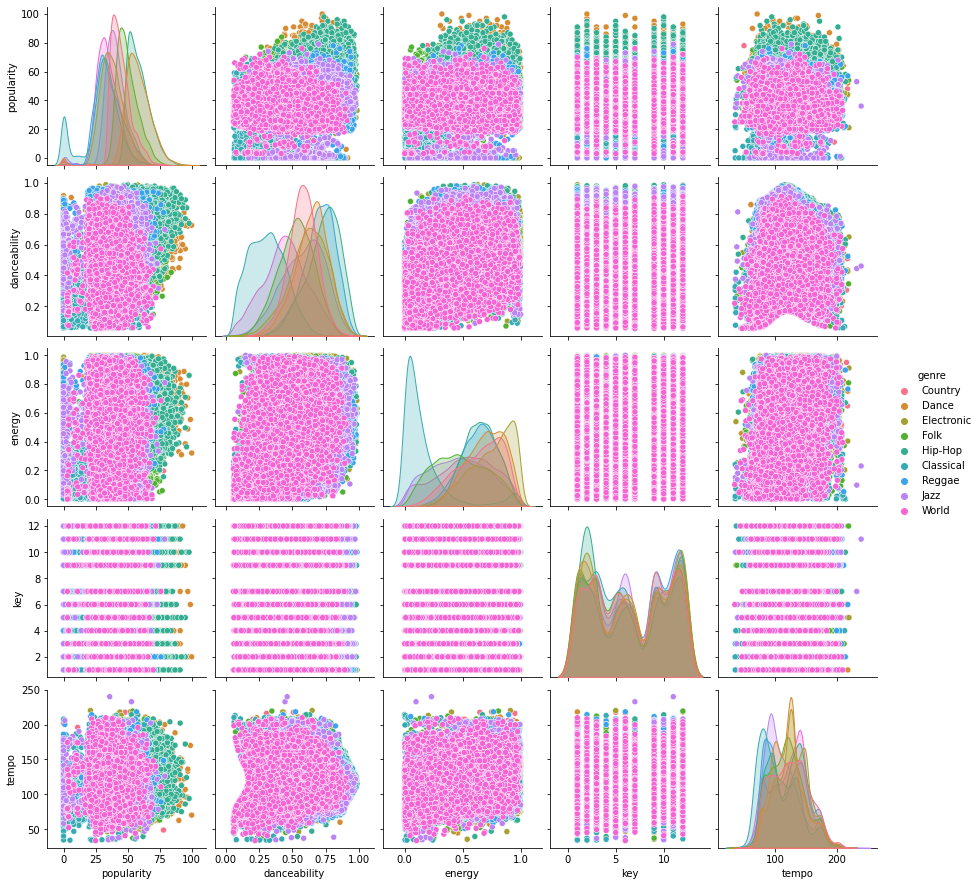

In [22]:
# check correlations for key params
sns.pairplot(df, hue='genre', vars=['popularity', 'danceability', 'energy', 'key', 'tempo'], palette='husl')

In [23]:
# select the pop, rock, hip-hop, classical, and jazz genres
df_selected = df[df["genre"].isin(["Electronic", "Hip-Hop", "Classical", "Jazz"])]

# create a histogram for key params
for col_name in ["popularity", "danceability", "energy", "key", "tempo"]:
    fig = px.histogram(df_selected, x=col_name, title=col_name, color="genre", opacity=0.4, barmode="overlay")
    fig.show()

In [24]:
# create a violin plot for the danceability
fig = px.violin(df_selected, x="genre", y="danceability", color="genre", title="Danceability by Genre")
fig.show()

In [25]:
# plot 3d scatter plot
fig = px.scatter_3d(df_selected, x='popularity', y='danceability', z='energy',
              color='genre', title='Popularity - Danceability - Energy by Genre', hover_name='genre')
fig.show()

## Normalize data

In [26]:
norm_map = {
    'popularity': 'normalization', 'key': 'normalization', 'genre': 'onehot',
    'loudness': 'normalization', 'tempo': 'standartization', 'time_signature': 'normalization'
}

def df_norm_standart_onehot(dataframe):
    result = dataframe.copy()
    for feature_name in norm_map:
        if norm_map[feature_name] == "normalization":
            max_value = dataframe[feature_name].max()
            min_value = dataframe[feature_name].min()
            result[feature_name] = (dataframe[feature_name] - min_value) / (max_value - min_value)
        if norm_map[feature_name] == "standartization":
            mean_value = dataframe[feature_name].mean()
            std_value = dataframe[feature_name].std()
            result[feature_name] = (dataframe[feature_name] - mean_value) / std_value
        if norm_map[feature_name] == "onehot":
            dummies = pd.get_dummies(dataframe[[feature_name]])
            result = pd.concat([result, dummies], axis=1)
            result = result.drop([feature_name], axis=1)
    return result

# drop unused col and norm data
norm_df = df.drop(columns=['track_id']).reset_index(drop=True)
norm_df = df_norm_standart_onehot(norm_df)
norm_df.head()

,popularity,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,mode,speechiness,...,valence,genre_Classical,genre_Country,genre_Dance,genre_Electronic,genre_Folk,genre_Hip-Hop,genre_Jazz,genre_Reggae,genre_World
0,0.43,0.276,0.602,0.729,0.000864,0.181818,0.0847,0.878890,1,0.0420,...,0.655,0,1,0,0,0,0,0,0,0
1,0.38,0.263,0.598,0.630,0.000000,0.363636,0.3410,0.846416,1,0.0236,...,0.564,0,1,0,0,0,0,0,0,0
2,0.40,0.290,0.760,0.627,0.000000,0.181818,0.0652,0.803246,1,0.0351,...,0.731,0,1,0,0,0,0,0,0,0
3,0.45,0.354,0.533,0.671,0.000000,0.545455,0.0702,0.821417,1,0.0303,...,0.887,0,1,0,0,0,0,0,0,0
4,0.36,0.221,0.530,0.582,0.000000,0.181818,0.2580,0.877521,1,0.0254,...,0.375,0,1,0,0,0,0,0,0,0


## Regression Train and Test data

In [27]:
from sklearn.model_selection import train_test_split

In [28]:
target = ['popularity']

# divide norm df to input and output arrays
X = norm_df.drop(columns=target).reset_index(drop=True)
Y = norm_df[target]
print("X shape: " + str(X.shape))
print("Y shape: " + str(Y.shape))

# split X and Y arrays to train and test samples
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=42)
print("Training X shape: " + str(x_train.shape))
print("Training Y shape: " + str(y_train.shape))
print("Test X shape: " + str(x_test.shape))
print("Test Y shape: " + str(y_test.shape))

X shape: (64800, 21)
Y shape: (64800, 1)
Training X shape: (45360, 21)
Training Y shape: (45360, 1)
Test X shape: (19440, 21)
Test Y shape: (19440, 1)


## Create models

In [29]:
from sklearn.linear_model import LinearRegression

from sklearn.linear_model import ElasticNet
from sklearn.model_selection import GridSearchCV

import xgboost as xgb

from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import VotingRegressor

from autogluon.tabular import TabularPredictor

In [30]:
# Linear regression model
lr_model = LinearRegression()

# Elastic net model
param_grid = {
    'alpha': np.linspace(0.01, 1.0, num=10),
    'l1_ratio': np.linspace(0.01, 1.0, num=10)
}
# create the grid search object
en_model = GridSearchCV(ElasticNet(), param_grid, cv=5)

# XGBoost model
xb_model = xgb.XGBRegressor()

# Voting regression model
reg1 = GradientBoostingRegressor(random_state=1)
reg2 = RandomForestRegressor(random_state=1)
reg3 = LinearRegression()
vr_model = VotingRegressor(estimators=[('gb', reg1), ('rf', reg2), ('lr', reg3)])

# autogluon TabularPredictor model
tp_model = TabularPredictor(label=target[0], path="agModels-predictPop")

## Fit models

In [31]:
# Linear regression model
lr_model.fit(x_train, y_train)

# Elastic net model
en_model.fit(x_train, y_train)

# XGBoost model
xb_model.fit(x_train, y_train)

# Voting regression model
vr_model.fit(x_train, y_train)

# autogluon TabularPredictor model
train_df = pd.concat([x_train, y_train], axis=1)
tp_model_predictor = tp_model.fit(train_df, presets="best_quality", time_limit=60)

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_voting.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

Presets specified: ['best_quality']
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=20
Beginning AutoGluon training ... Time limit = 60s
AutoGluon will save models to "agModels-predictPop/"
AutoGluon Version:  0.6.1
Python Version:     3.8.16
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP Fri Aug 26 08:44:51 UTC 2022
Train Data Rows:    45360
Train Data Columns: 21
Label Column: popularity
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and label-values can't be converted to int).
	Label info (max, min, mean, stddev): (1.0, 0.0, 0.4296, 0.14016)
	If 'regression' is not the correct problem_type, please manually speci

## Evaluate models


In [32]:
from sklearn.metrics import mean_squared_error, r2_score

In [33]:
# Linear regression model
y_pred = lr_model.predict(x_test)
mse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
print(f"Linear regression model Test RMSE: {round(mse, 3)}; R^2 score: {round(r2, 3)}")

# Elastic net model
y_pred = en_model.best_estimator_.predict(x_test)
mse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
print(f"Elastic net model Test RMSE: {round(mse, 3)}; R^2 score: {round(r2, 3)}")

# XGBoost model
y_pred = xb_model.predict(x_test)
mse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
print(f"XGBoost model Test RMSE: {round(mse, 3)}; R^2 score: {round(r2, 3)}")

# Voting regression model
y_pred = vr_model.predict(x_test)
mse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
print(f"Voting regression model Test RMSE: {round(mse, 3)}; R^2 score: {round(r2, 3)}")

# autogluon TabularPredictor model
y_pred = tp_model_predictor.predict(x_test)
mse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
print(f"autogluon TabularPredictor model Test RMSE: {round(mse, 3)}; R^2 score: {round(r2, 3)}")

Linear regression model Test RMSE: 0.1; R^2 score: 0.495
Elastic net model Test RMSE: 0.1; R^2 score: 0.489
XGBoost model Test RMSE: 0.099; R^2 score: 0.508
Voting regression model Test RMSE: 0.097; R^2 score: 0.52
autogluon TabularPredictor model Test RMSE: 0.097; R^2 score: 0.526


In [34]:
# show leaderboard
test_df = pd.concat([x_test, y_test], axis=1)
tp_model_predictor.leaderboard(test_df, silent=True)

,model,score_test,score_val,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,LightGBMXT_BAG_L1,-0.096664,-0.097886,3.203348,1.931128,34.087052,3.203348,1.931128,34.087052,1,True,3
1,WeightedEnsemble_L2,-0.096664,-0.097886,3.206007,1.932678,34.607126,0.002659,0.001550,0.520074,2,True,4
2,LightGBMXT_BAG_L2,-0.096768,-0.098043,7.671838,9.622446,57.976578,1.089342,0.607688,23.549899,2,True,5
3,WeightedEnsemble_L3,-0.096768,-0.098043,7.674417,9.624120,57.982316,0.002578,0.001674,0.005738,3,True,6
4,KNeighborsUnif_BAG_L1,-0.133183,-0.134430,1.710505,3.546695,0.170311,1.710505,3.546695,0.170311,1,True,1
5,KNeighborsDist_BAG_L1,-0.133338,-0.134914,1.668642,3.536937,0.169316,1.668642,3.536937,0.169316,1,True,2


In [35]:
# show feature importance
tp_model_predictor.feature_importance(test_df)

Computing feature importance via permutation shuffling for 21 features using 5000 rows with 5 shuffle sets...
	109.04s	= Expected runtime (21.81s per shuffle set)
	107.54s	= Actual runtime (Completed 5 of 5 shuffle sets)


,importance,stddev,p_value,n,p99_high,p99_low
genre_Hip-Hop,0.036607,0.001104,9.898715e-08,5,0.038879,0.034335
genre_Dance,0.031852,0.002321,3.360075e-06,5,0.036631,0.027073
genre_Folk,0.015107,0.000956,1.912455e-06,5,0.017075,0.013139
instrumentalness,0.004634,0.000273,1.431463e-06,5,0.005195,0.004072
genre_Country,0.004199,0.000301,3.148418e-06,5,0.004818,0.003579
genre_Classical,0.004054,0.000576,4.763172e-05,5,0.005240,0.002868
genre_Jazz,0.001972,0.000173,7.043643e-06,5,0.002328,0.001615
loudness,0.001341,0.000302,2.903048e-04,5,0.001963,0.000718
acousticness,0.001108,0.000177,7.569929e-05,5,0.001473,0.000744
liveness,0.000942,0.000233,4.134924e-04,5,0.001422,0.000463


## Classification Train and Test data

In [36]:
target = [col for col in norm_df.columns if col.startswith('genre')]

# divide norm df to input and output arrays
X = norm_df.drop(columns=target).reset_index(drop=True)
Y = norm_df[target]
print("X shape: " + str(X.shape))
print("Y shape: " + str(Y.shape))

# split X and Y arrays to train and test samples
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=42)
print("Training X shape: " + str(x_train.shape))
print("Training Y shape: " + str(y_train.shape))
print("Test X shape: " + str(x_test.shape))
print("Test Y shape: " + str(y_test.shape))

X shape: (64800, 13)
Y shape: (64800, 9)
Training X shape: (45360, 13)
Training Y shape: (45360, 9)
Test X shape: (19440, 13)
Test Y shape: (19440, 9)


## Feature engineering

In [37]:
from sklearn.multioutput import MultiOutputClassifier
from sklearn.ensemble import RandomForestClassifier

In [38]:
# RF
rf = RandomForestClassifier(n_estimators=10)
rf_model = MultiOutputClassifier(estimator=rf)

# fit model
rf_model.fit(x_train, y_train)

MultiOutputClassifier(estimator=RandomForestClassifier(n_estimators=10))

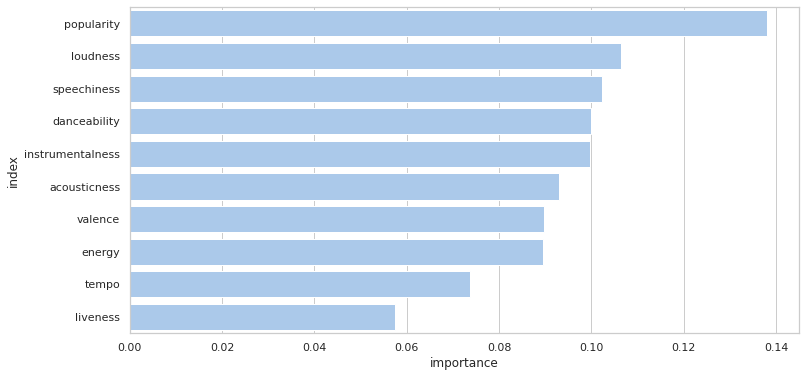

In [39]:
# extract feature importance
feat_impts = []
for clf in rf_model.estimators_:
    feat_impts.append(clf.feature_importances_)
feature_importances = pd.DataFrame(np.mean(feat_impts, axis=0), 
                                   index=x_train.columns, 
                                   columns=['importance']).sort_values('importance', ascending=False)
feature_importances = feature_importances.reset_index()

# show a bar plot
sns.set(style="whitegrid")
f, ax = plt.subplots(figsize=(12, 6))
sns.set_color_codes("pastel")
sns.barplot(x="importance", y='index', data=feature_importances[0:10],
            label="Total", color="b")

In [40]:
input = ["popularity", "instrumentalness", "speechiness", "danceability", "acousticness", "loudness", "valence", "energy", "tempo"]
target = [col for col in norm_df.columns if col.startswith('genre')]

# divide norm df to input and output arrays
X = norm_df[input]
Y = norm_df[target]
print("X shape: " + str(X.shape))
print("Y shape: " + str(Y.shape))

# split X and Y arrays to train and test samples
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=42)
print("Training X shape: " + str(x_train.shape))
print("Training Y shape: " + str(y_train.shape))
print("Test X shape: " + str(x_test.shape))
print("Test Y shape: " + str(y_test.shape))

X shape: (64800, 9)
Y shape: (64800, 9)
Training X shape: (45360, 9)
Training Y shape: (45360, 9)
Test X shape: (19440, 9)
Test Y shape: (19440, 9)


## Create models

In [41]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from keras.models import Sequential
from keras.layers import Dense
from keras.callbacks import EarlyStopping

In [42]:
# kNN
knn = KNeighborsClassifier()
knn_model = MultiOutputClassifier(estimator=knn)

# SVM
param_grid = {
    'estimator__kernel': ['linear', 'poly', 'rbf'],
    'estimator__C': np.linspace(1e3, 1.0, num=3),
    'estimator__gamma': np.linspace(0.01, 1.0, num=3)
}
# create the grid search object
svm_model = GridSearchCV(MultiOutputClassifier(estimator=SVC()), param_grid, cv=5)

# DecisionTree
dtree = DecisionTreeClassifier()
dtree_model = MultiOutputClassifier(estimator=dtree)

# RF
param_grid = {
    'estimator__n_estimators': [1, 2, 4, 8, 16]
}
# create the grid search object
rf_model = GridSearchCV(MultiOutputClassifier(estimator=RandomForestClassifier()), param_grid, cv=5)

# MLP
x_shape, y_shape = x_train.shape[1], y_train.shape[1]
mean_shape = (x_shape + y_shape) // 2
mlp_model = Sequential()
mlp_model.add(Dense(x_shape, input_shape=(x_shape,), activation='relu'))
mlp_model.add(Dense(mean_shape, activation='relu'))
mlp_model.add(Dense(y_shape, activation='softmax'))
es = EarlyStopping(monitor='val_accuracy', verbose=1, patience=5)
mlp_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
print(mlp_model.summary())

# autogluon TabularPredictor model
tp_model = TabularPredictor(label="genre", path="agModels-predictGenre")

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 9)                 90        
                                                                 
 dense_1 (Dense)             (None, 9)                 90        
                                                                 
 dense_2 (Dense)             (None, 9)                 90        
                                                                 
Total params: 270
Trainable params: 270
Non-trainable params: 0
_________________________________________________________________
None


## Fit models

In [43]:
# kNN
knn_model.fit(x_train, y_train)

# SVM
svm_model.fit(x_train[:100], y_train[:100])

# DecisionTree
dtree_model.fit(x_train, y_train)

# RF
rf_model.fit(x_train, y_train)

# MLP
history = mlp_model.fit(x_train, y_train, validation_data=(x_test, y_test), epochs=10000, callbacks=[es], batch_size=512, verbose=2)

# autogluon TabularPredictor model
one_hot_columns = y_train.columns.tolist()
categories = y_train[one_hot_columns].idxmax(axis=1)
genres = categories.str.replace("genre_", '').to_frame(name="genre")
train_df = pd.concat([x_train, genres], axis=1)
tp_model_predictor = tp_model.fit(train_df, presets="best_quality", time_limit=60)

Epoch 1/10000
89/89 - 2s - loss: 2.2031 - accuracy: 0.1189 - val_loss: 2.1784 - val_accuracy: 0.1642 - 2s/epoch - 21ms/step
Epoch 2/10000
89/89 - 0s - loss: 2.1464 - accuracy: 0.2148 - val_loss: 2.0980 - val_accuracy: 0.2235 - 352ms/epoch - 4ms/step
Epoch 3/10000
89/89 - 0s - loss: 2.0263 - accuracy: 0.2277 - val_loss: 1.9547 - val_accuracy: 0.2298 - 270ms/epoch - 3ms/step
Epoch 4/10000
89/89 - 0s - loss: 1.8754 - accuracy: 0.2687 - val_loss: 1.8014 - val_accuracy: 0.3239 - 357ms/epoch - 4ms/step
Epoch 5/10000
89/89 - 0s - loss: 1.7330 - accuracy: 0.3692 - val_loss: 1.6730 - val_accuracy: 0.3840 - 272ms/epoch - 3ms/step
Epoch 6/10000
89/89 - 0s - loss: 1.6264 - accuracy: 0.4081 - val_loss: 1.5821 - val_accuracy: 0.4353 - 287ms/epoch - 3ms/step
Epoch 7/10000
89/89 - 0s - loss: 1.5513 - accuracy: 0.4521 - val_loss: 1.5162 - val_accuracy: 0.4627 - 284ms/epoch - 3ms/step
Epoch 8/10000
89/89 - 0s - loss: 1.4933 - accuracy: 0.4721 - val_loss: 1.4621 - val_accuracy: 0.4932 - 277ms/epoch - 3ms

Presets specified: ['best_quality']
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=20
Beginning AutoGluon training ... Time limit = 60s
AutoGluon will save models to "agModels-predictGenre/"
AutoGluon Version:  0.6.1
Python Version:     3.8.16
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP Fri Aug 26 08:44:51 UTC 2022
Train Data Rows:    45360
Train Data Columns: 9
Label Column: genre
Preprocessing data ...
AutoGluon infers your prediction problem is: 'multiclass' (because dtype of label-column == object).
	9 unique label values:  ['Hip-Hop', 'World', 'Classical', 'Reggae', 'Jazz', 'Country', 'Electronic', 'Folk', 'Dance']
	If 'multiclass' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Train Data Class Count: 9
Using Feature Generators to preprocess the data ...
Fitting Auto

## Evaluate models


In [44]:
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix

kNN model Test Accuracy: 0.444; F1 score: 0.529
SVM model Test Accuracy: 0.263; F1 score: 0.366
DecisionTree model Test Accuracy: 0.352; F1 score: 0.506
RF model Test Accuracy: 0.443; F1 score: 0.568
autogluon TabularPredictor model Test Accuracy: 0.622; F1 score: 0.622
608/608 [==============================] - 1s 1ms/step
MLP model Test Accuracy: 0.381; F1 score: 0.499


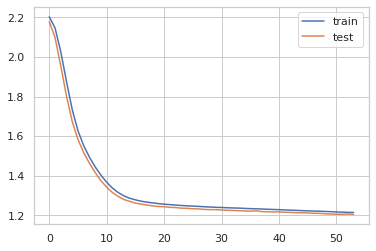

In [45]:
# kNN
y_pred = knn_model.predict(x_test)
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='micro')
print(f"kNN model Test Accuracy: {round(accuracy, 3)}; F1 score: {round(f1, 3)}")

# SVM
y_pred = svm_model.best_estimator_.predict(x_test)
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='micro')
print(f"SVM model Test Accuracy: {round(accuracy, 3)}; F1 score: {round(f1, 3)}")

# DecisionTree
y_pred = dtree_model.predict(x_test)
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='micro')
print(f"DecisionTree model Test Accuracy: {round(accuracy, 3)}; F1 score: {round(f1, 3)}")

# RF
y_pred = rf_model.best_estimator_.predict(x_test)
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='micro')
print(f"RF model Test Accuracy: {round(accuracy, 3)}; F1 score: {round(f1, 3)}")

# autogluon TabularPredictor model
y_pred = tp_model_predictor.predict(x_test)
norm_map = {"genre": "onehot"}
y_pred = df_norm_standart_onehot(y_pred.to_frame(name="genre"))
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='micro')
print(f"autogluon TabularPredictor model Test Accuracy: {round(accuracy, 3)}; F1 score: {round(f1, 3)}")

# MLP
y_pred = mlp_model.predict(x_test)
y_pred = np.round(y_pred)
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='micro')
print(f"MLP model Test Accuracy: {round(accuracy, 3)}; F1 score: {round(f1, 3)}")

# plot MLP train history
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

In [46]:
# get best predictions
y_pred = tp_model_predictor.predict(x_test)
norm_map = {"genre": "onehot"}
y_pred = df_norm_standart_onehot(y_pred.to_frame(name="genre"))

# calculate confusion matrix
cm = confusion_matrix(y_pred.values.argmax(axis=1), y_test.values.argmax(axis=1))

# plot a graph
class_labels = y_train.columns.str.replace("genre_", '')
color_scale = px.colors.diverging.Tealrose
fig = px.imshow(cm, x=class_labels, y=class_labels, color_continuous_scale=color_scale)
fig.update_layout(xaxis_title="Predicted", yaxis_title="Actual", title="Confusion Matrix")
fig.show()

## Test inference

In [47]:
# load model
tp_model_predictor = TabularPredictor.load("agModels-predictGenre/")

In [48]:
#@title Input your data { run: "auto" }
popularity = 0.7 #@param {type:"slider", min:0, max:1, step:0.1}
instrumentalness = 0.2 #@param {type:"slider", min:0, max:1, step:0.1}
speechiness = 0.7 #@param {type:"slider", min:0, max:1, step:0.1}
danceability = 0.8 #@param {type:"slider", min:0, max:1, step:0.1}
acousticness = 0.1 #@param {type:"slider", min:0, max:1, step:0.1}
loudness = 0.9 #@param {type:"slider", min:0, max:1, step:0.1}
valence = 0.9 #@param {type:"slider", min:0, max:1, step:0.1}
energy = 0.5 #@param {type:"slider", min:0, max:1, step:0.1}
tempo = 0 #@param {type:"slider", min:-1, max:1, step:0.1}
int_data = pd.DataFrame([[popularity, instrumentalness, speechiness, danceability, acousticness, loudness, valence, energy, tempo]], columns=["popularity", "instrumentalness", "speechiness", "danceability", "acousticness", "loudness", "valence", "energy", "tempo"])

genre_pred = tp_model_predictor.predict(int_data)
print(f"Predicted genre: {genre_pred.item()}")

Predicted genre: Hip-Hop


## Clustering Train data

In [49]:
target = [col for col in norm_df.columns if col.startswith('genre')]

# divide norm df to input array
X = norm_df.drop(columns=target).reset_index(drop=True)
print("X shape: " + str(X.shape))

X shape: (64800, 13)


## Create and fit models

In [50]:
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [ ]:
# reduce the dimensionality of the data to 2 dimensions using t-SNE
tsne = TSNE(n_components=2)
X_tsne = tsne.fit_transform(X)

In [56]:
silhouette_scores = []
X_tsne_sample = np.random.permutation(X_tsne)[:20000]
for n_clusters in tqdm(range(2, 14)):
    # fit a k-means model to the sample with the current number of clusters
    kmeans = KMeans(n_clusters=n_clusters)
    kmeans.fit(X_tsne_sample)
    
    # calculate the silhouette score for the current model
    score = silhouette_score(X_tsne_sample, kmeans.labels_)
    silhouette_scores.append(score)

# fit a k-means model to the data with the optimal number of clusters
optimal_n_clusters = np.argmax(silhouette_scores) + 2
print(f"Optimal number of clusters: {optimal_n_clusters}")
optimal_kmeans = KMeans(n_clusters=optimal_n_clusters)
optimal_kmeans.fit(X_tsne)

100%|██████████| 12/12 [01:22<00:00,  6.85s/it]


Optimal number of clusters: 3


KMeans(n_clusters=3)

## Evaluate models

In [57]:
# extract the cluster labels
cluster_labels = optimal_kmeans.labels_

# create a scatter plot
fig = px.scatter(x=X_tsne[:, 0], y=X_tsne[:, 1], color=cluster_labels)
fig.show()